In [5]:
import onnx

def get_onnx_io_shapes(onnx_path):
    # Load the ONNX model
    model = onnx.load(onnx_path)

    # Get the input and output shapes
    input_shape = []
    output_shape = []

    for input in model.graph.input:
        input_shape.append((input.name, [dim.dim_value for dim in input.type.tensor_type.shape.dim]))

    for output in model.graph.output:
        output_shape.append((output.name, [dim.dim_value for dim in output.type.tensor_type.shape.dim]))

    return input_shape, output_shape

# Path to the ONNX model file
onnx_paths = ['yolov8n-seg.onnx', 'yolov8n-pose.onnx']

for onnx_path in onnx_paths:
    print('model: ', onnx_path)
    input_shape, output_shape = get_onnx_io_shapes(onnx_path)

    print("Input shapes:")
    for name, shape in input_shape:
        print(name, shape)

    print("Output shapes:")
    for name, shape in output_shape:
        print(name, shape)
    print()

model:  yolov8n-seg.onnx
Input shapes:
images [1, 3, 640, 640]
Output shapes:
output0 [1, 116, 8400]
output1 [1, 32, 160, 160]

model:  yolov8n-pose.onnx
Input shapes:
images [1, 3, 640, 640]
Output shapes:
output0 [1, 56, 8400]



In [2]:
import numpy as np
import onnxruntime
import cv2
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import onnx

In [54]:
img = Image.open('3.jpg')
img_width, img_height = img.size
img = img.convert("RGB")
img = img.resize((640,640))

input = np.array(img)
input = input.transpose(2, 0, 1)
input = input.reshape(1,3,640,640).astype("float32")
input = input/255.0
input.shape

(1, 3, 640, 640)

In [55]:
model = onnxruntime.InferenceSession("yolov8n-seg.onnx")
result = model.run(None, {"images":input})

In [56]:
output0, output1 = result[0], result[1]
print(output0.shape, output1.shape)

(1, 116, 8400) (1, 32, 160, 160)


In [57]:
output0 = output0[0].transpose()
output1 = output1[0]
print("Output0:",output0.shape,"Output1:",output1.shape)

boxes = output0[:,0:84]
masks = output0[:,84:]
print("Boxes:",boxes.shape,"Masks:",masks.shape)

Output0: (8400, 116) Output1: (32, 160, 160)
Boxes: (8400, 84) Masks: (8400, 32)


In [58]:
output1 = output1.reshape(32,160*160)
masks = masks @ output1
print(masks.shape)
boxes = np.hstack([boxes,masks])
print(boxes.shape)

yolo_classes = [
    "person", "bicycle", "car", "motorcycle", "airplane", "bus", "train", "truck", "boat",
    "traffic light", "fire hydrant", "stop sign", "parking meter", "bench", "bird", "cat", "dog", "horse",
    "sheep", "cow", "elephant", "bear", "zebra", "giraffe", "backpack", "umbrella", "handbag", "tie",
    "suitcase", "frisbee", "skis", "snowboard", "sports ball", "kite", "baseball bat", "baseball glove",
    "skateboard", "surfboard", "tennis racket", "bottle", "wine glass", "cup", "fork", "knife", "spoon",
    "bowl", "banana", "apple", "sandwich", "orange", "broccoli", "carrot", "hot dog", "pizza", "donut",
    "cake", "chair", "couch", "potted plant", "bed", "dining table", "toilet", "tv", "laptop", "mouse",
    "remote", "keyboard", "cell phone", "microwave", "oven", "toaster", "sink", "refrigerator", "book",
    "clock", "vase", "scissors", "teddy bear", "hair drier", "toothbrush"
]

def intersection(box1,box2):
    box1_x1,box1_y1,box1_x2,box1_y2 = box1[:4]
    box2_x1,box2_y1,box2_x2,box2_y2 = box2[:4]
    x1 = max(box1_x1,box2_x1)
    y1 = max(box1_y1,box2_y1)
    x2 = min(box1_x2,box2_x2)
    y2 = min(box1_y2,box2_y2)
    return (x2-x1)*(y2-y1) 

def union(box1,box2):
    box1_x1,box1_y1,box1_x2,box1_y2 = box1[:4]
    box2_x1,box2_y1,box2_x2,box2_y2 = box2[:4]
    box1_area = (box1_x2-box1_x1)*(box1_y2-box1_y1)
    box2_area = (box2_x2-box2_x1)*(box2_y2-box2_y1)
    return box1_area + box2_area - intersection(box1,box2)

def iou(box1,box2):
    return intersection(box1,box2)/union(box1,box2)

def sigmoid(z):
    return 1/(1 + np.exp(-z))

def get_mask(row, box, img_width, img_height):
    # convert mask to image (matrix of pixels)
    mask = row.reshape(160,160)
    mask = sigmoid(mask)
    mask = (mask > 0.2).astype("uint8")*255
    # crop the object defined by "box" from mask
    x1,y1,x2,y2 = box
    mask_x1 = round(x1/img_width*160)
    mask_y1 = round(y1/img_height*160)
    mask_x2 = round(x2/img_width*160)
    mask_y2 = round(y2/img_height*160)
    mask = mask[mask_y1:mask_y2,mask_x1:mask_x2]
    # resize the cropped mask to the size of object
    img_mask = Image.fromarray(mask,"L")
    img_mask = img_mask.resize((round(x2-x1),round(y2-y1)))
    mask = np.array(img_mask)
    return mask

# calculate bounding polygon from mask
def get_polygon(mask):
    contours = cv2.findContours(mask, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    polygon = [[contour[0][0],contour[0][1]] for contour in contours[0][0]]
    return polygon

# parse and filter all boxes
objects = []
for row in boxes:
    xc,yc,w,h = row[:4]
    x1 = (xc-w/2)/640*img_width
    y1 = (yc-h/2)/640*img_height
    x2 = (xc+w/2)/640*img_width
    y2 = (yc+h/2)/640*img_height
    prob = row[4:84].max()
    if prob < 0.5:
        continue
    class_id = row[4:84].argmax()
    label = yolo_classes[class_id]
    mask = get_mask(row[84:25684], (x1,y1,x2,y2), img_width, img_height)
    polygon = get_polygon(mask)
    objects.append([x1,y1,x2,y2,label,prob,mask,polygon])


# apply non-maximum suppression
objects.sort(key=lambda x: x[5], reverse=True)
result = []
while len(objects)>0:
    result.append(objects[0])
    objects = [object for object in objects if iou(object,objects[0])<0.7]

len(result)

(8400, 25600)
(8400, 25684)


1

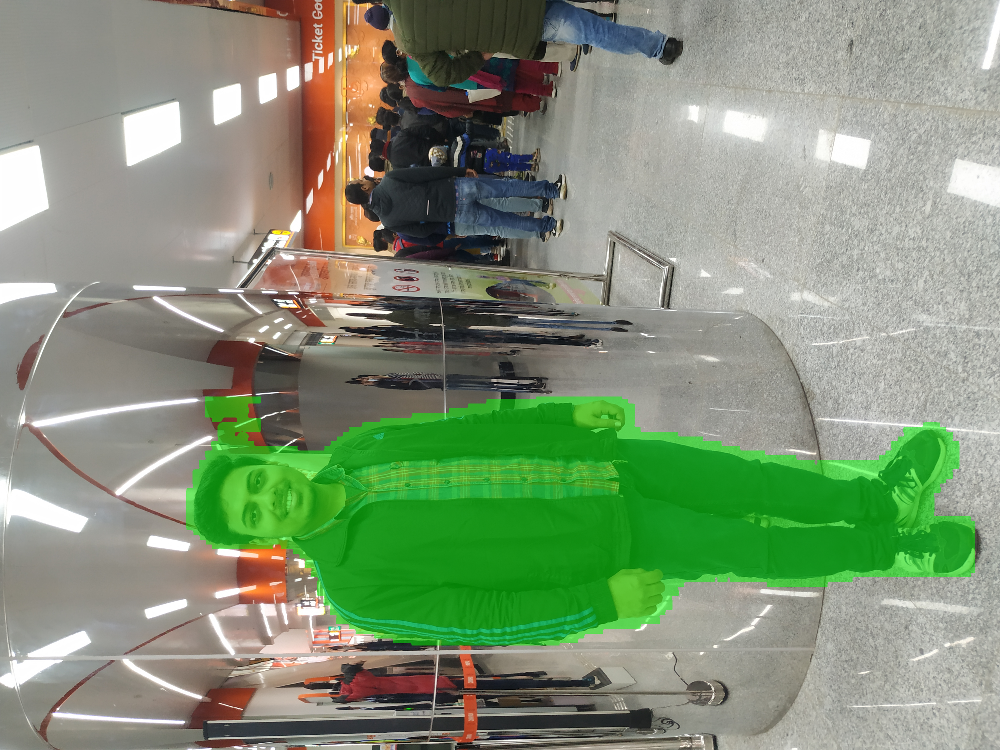

In [59]:
img = Image.open("3.jpg")
draw = ImageDraw.Draw(img, "RGBA")
for object in [result[0]]:
    [x1, y1, x2, y2, label, prob, mask, polygon] = object
    # move polygon from (0,0) to the top left point of detected object
    polygon = [(round(x1+point[0]),round(y1+point[1])) for point in polygon]
    draw.polygon(polygon, fill=(0, 255, 0, 125))

img

In [77]:
model_path = 'yolov8n-pose.onnx'
ort_session = onnxruntime.InferenceSession(model_path, providers=['CPUExecutionProvider'])

img = Image.open('3.jpg')
img_width, img_height = img.size
img = img.convert("RGB")
reimg = img.resize((640,640))

input = np.array(reimg)
input = input.transpose(2, 0, 1)
input = input.reshape(1,3,640,640).astype("float32")
input = input/255.0
print(input.shape)

# Perform inference
input_name = ort_session.get_inputs()[0].name
output_name = ort_session.get_outputs()[0].name
result = ort_session.run([output_name], {input_name: input})

len(result)

(1, 3, 640, 640)


1

In [78]:
output_data = result[0][0].transpose()
output_data.shape

(8400, 56)

[4]
0.6841753 [     179.11      428.47     0.96713      171.06      411.46     0.90297      164.96      431.71     0.88493      178.66       393.1     0.67593       162.3      441.78     0.54001       222.5      383.43      0.9885      238.22      471.58      0.9873      307.02      364.26      0.9528      335.84      526.01
     0.95262      367.34      361.26     0.90386      393.16      516.93     0.91193      403.44      420.64     0.97492      411.95      472.74     0.97559      461.02      399.13     0.94662      482.31      464.04     0.95037      559.27      436.98     0.83157      565.78      490.19     0.84729]


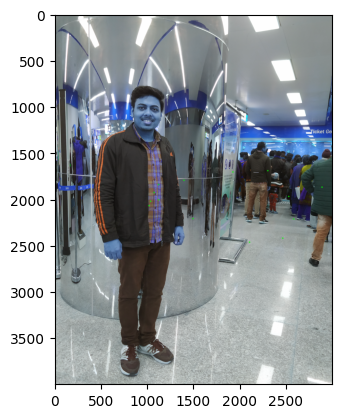

In [79]:
def postprocess(input_image, output):
        # Transpose and squeeze the output to match the expected shape
        outputs = np.transpose(np.squeeze(output[0]))
        # Get the number of rows in the outputs array
        rows = outputs.shape[0]

        # Lists to store the bounding boxes, scores, and class IDs of the detections
        boxes = []
        scores = []
        # class_ids = []
        keypoints_list = []

        # Calculate the scaling factors for the bounding box coordinates
        x_factor = img_width / 640
        y_factor = img_height / 640

        # Iterate over each row in the outputs array
        for i in range(rows):

            confidence = outputs[i][4]

            # If the maximum score is above the confidence threshold
            if confidence >= 0.3:
                # Extract the class scores from the current row
                # classes_id = outputs[i][5:]
                # Extract the bounding box coordinates from the current row
                x, y, w, h = outputs[i][0], outputs[i][1], outputs[i][2], outputs[i][3]

                keypoints = outputs[i][5:]

                # Calculate the scaled coordinates of the bounding box
                left = int((x - w / 2) * x_factor)
                top = int((y - h / 2) * y_factor)
                width = int(w * x_factor)
                height = int(h * y_factor)

                # Add the class ID, score, and box coordinates to the respective lists
                # class_ids.append(classes_id)
                scores.append(confidence)
                boxes.append([left, top, width, height])
                keypoints_list.append(keypoints)

        # Apply non-maximum suppression to filter out overlapping bounding boxes
        indices = cv2.dnn.NMSBoxes(boxes, scores, 0.4, 0)

        # Iterate over the selected indices after non-maximum suppression
        for i in indices:
            # Get the box, score, and class ID corresponding to the index
            box = boxes[i]
            score = scores[i]
            # class_id = class_ids[i]
            keypoints = keypoints_list[i]
            print(score)

            # Draw the detection on the input image
            #self.draw_detections(input_image, box, score, class_id=0)

            for i in range(0, len(keypoints), 3):
                x, y, conf = keypoints[i:i + 3]
                x = round(x * x_factor)
                y = round(y * y_factor)
                cv2.circle(input_image, (x, y), 5, (0, 255, 0), 3)

        # Return the modified input image
        return input_image
img = cv2.imread('3.jpg')
img1 = postprocess(np.array(img), result[0])
plt.imshow(img1)

In [29]:
keypoints = []
for i in range(len(output_data)):
    if output_data[i][4]>0.65:
        req = []
        for j in range(5,55,2):
            req.append((output_data[i][j], output_data[i][j+1]))
        keypoints.append(req)
len(keypoints)

index 8251
index 8270
index 8271
index 8272
index 8290
index 8291
index 8292


7

In [49]:
output = output_data
bboxList = []
scoreList = []
indicesList = []
kpList = []

def clamp(val, minimum, maximum):
        return max(minimum, min(val, maximum))

for i in range(8400):
    row_ptr = output[i, :]
    bbox_ptr = row_ptr[:4]
    score_ptr = row_ptr[4]
    kp_ptr = row_ptr[5:]

    score = score_ptr.item()
    if score > 0.6:
        x = bbox_ptr[0].item()
        y = bbox_ptr[1].item()
        w = bbox_ptr[2].item()
        h = bbox_ptr[3].item()

        x0 = clamp((x - 0.5 * w) * 1.0, 0.0, float(img_width))
        y0 = clamp((y - 0.5 * h) * 1.0, 0.0, float(img_height))
        x1 = clamp((x + 0.5 * w) * 1.0, 0.0, float(img_width))
        y1 = clamp((y + 0.5 * h) * 1.0, 0.0, float(img_height))

        bbox = (x0, y0, x1 - x0, y1 - y0)

        kps = []
        for k in range(17):
            kps_x = kp_ptr[3 * k].item()
            kps_y = kp_ptr[3 * k + 1].item()
            kps_s = kp_ptr[3 * k + 2].item()
            kps_x = clamp(kps_x, 0.0, float(img_width))
            kps_y = clamp(kps_y, 0.0, float(img_height))

            kps.append([kps_x, kps_y, kps_s])

        bboxList.append(bbox)
        scoreList.append(score)
        kpList.append(kps)

#cv2.dnn.NMSBoxes(bboxList, scoreList, 0.8, 0.2, indicesList)
cv2.dnn.NMSBoxes(bboxList, scoreList, 0.5, 0.0, top_k=2)
len(kpList)

9

In [60]:
print(cv2.dnn.NMSBoxes(bboxList, scoreList, 0.5, 0.1, top_k=3))
kpList[4]

[4]


[[179.1088409423828, 428.46795654296875, 0.9671289920806885],
 [171.06341552734375, 411.4554443359375, 0.9029712080955505],
 [164.95785522460938, 431.712646484375, 0.8849291801452637],
 [178.6611328125, 393.0997009277344, 0.6759279370307922],
 [162.301513671875, 441.7833557128906, 0.5400052070617676],
 [222.50103759765625, 383.42730712890625, 0.9885045886039734],
 [238.21673583984375, 471.575927734375, 0.9873013496398926],
 [307.01776123046875, 364.25653076171875, 0.9527996778488159],
 [335.83837890625, 526.010009765625, 0.9526232481002808],
 [367.3426513671875, 361.2552795410156, 0.9038568735122681],
 [393.15594482421875, 516.92626953125, 0.9119347333908081],
 [403.44464111328125, 420.6395263671875, 0.9749183654785156],
 [411.94720458984375, 472.7431945800781, 0.9755939841270447],
 [461.0155944824219, 399.1286926269531, 0.9466180801391602],
 [482.30853271484375, 464.041259765625, 0.9503730535507202],
 [559.27001953125, 436.97576904296875, 0.831571102142334],
 [565.78466796875, 490.194

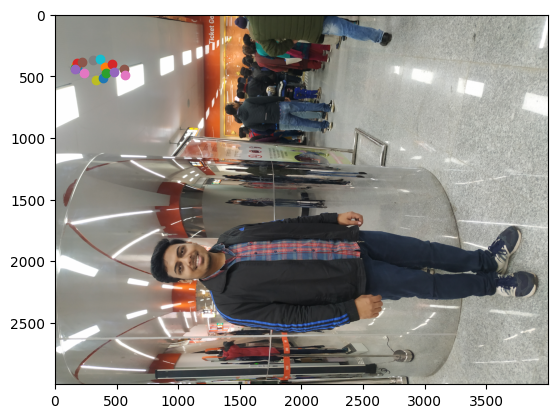

In [61]:
image = Image.open('3.jpg')
plt.imshow(image)
for x,y,z in kpList[4]:
    plt.scatter(x,y)
plt.show()

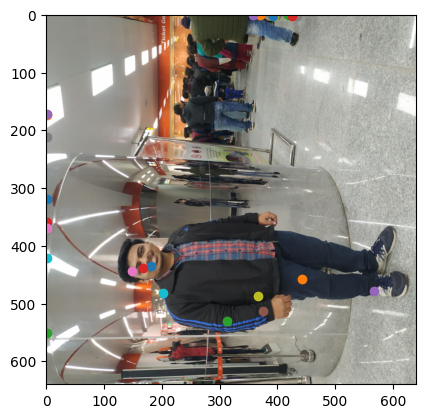

In [33]:
#image = Image.open('3.jpg')
plt.imshow(reimg)
for (x,y) in keypoints[3]:
    #plt.scatter(x*img_width/640,y*img_height/640)
    plt.scatter(x,y)
plt.show()

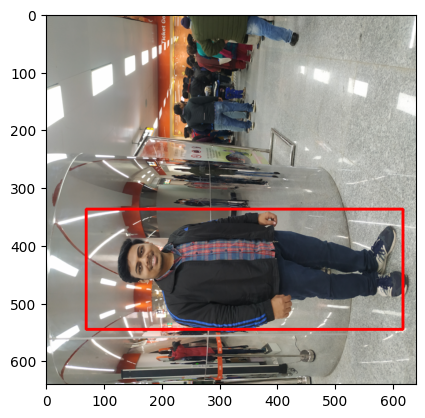

In [25]:
import copy
img = copy.deepcopy(reimg)
img1 = cv2.rectangle(np.array(reimg), (int(output_data[8290][0])-int(output_data[8290][2]//2), int(output_data[8290][1])-int(output_data[8290][3])//2), (int(output_data[8290][0])+int(output_data[8290][2])//2, int(output_data[8290][1])+int(output_data[8290][3])//2), (255,0,0), 4)
plt.imshow(img1)

In [2]:
from ultralytics import YOLO

model = YOLO(f'http://localhost:8000/yolov8n-pose.onnx', task='pose')
results = model('3.jpg')

Found http://localhost:8000/yolov8n-pose.onnx locally at yolov8n-pose.onnx
Loading yolov8n-pose.onnx for ONNX Runtime inference...

image 1/1 c:\Users\GAUTAM\OneDrive\Desktop\yolov8\3.jpg: 640x640 6 persons, 51.0ms
Speed: 12.3ms preprocess, 51.0ms inference, 17.8ms postprocess per image at shape (1, 3, 640, 640)


In [ ]:
import concurrent.futures
from datetime import datetime
times = []
for n in range(1,20):
    try:
        t1 = datetime.now()
        with concurrent.futures.ThreadPoolExecutor() as executor:
            results = executor.map(model, ['3.jpg']*n)
        t2 = datetime.now()
        for i,res in enumerate(results):
            print(i, end = '\r')
    except Exception:
        continue
    times.append(t2-t1)
print(t2-t1)

In [7]:
print(len(times))
inference_time = []
for t in times:
    inference_time.append(t.seconds*1000+t.microseconds/1000)

16


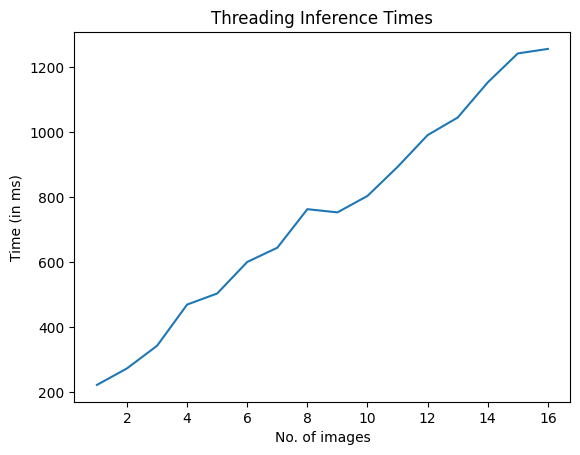

In [8]:
import matplotlib.pyplot as plt
import numpy as np
plt.plot(range(1,len(times)+1),np.array(inference_time))
plt.xlabel('No. of images')
plt.ylabel('Time (in ms)')
plt.title('Threading Inference Times')
plt.show()

In [7]:
%%timeit
results = model('3.jpg')
# shared memory


image 1/1 c:\Users\GAUTAM\OneDrive\Desktop\yolov8\3.jpg: 640x640 6 persons, 42.5ms
Speed: 5.4ms preprocess, 42.5ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 c:\Users\GAUTAM\OneDrive\Desktop\yolov8\3.jpg: 640x640 6 persons, 40.8ms
Speed: 2.9ms preprocess, 40.8ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 c:\Users\GAUTAM\OneDrive\Desktop\yolov8\3.jpg: 640x640 6 persons, 40.4ms
Speed: 4.0ms preprocess, 40.4ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 c:\Users\GAUTAM\OneDrive\Desktop\yolov8\3.jpg: 640x640 6 persons, 38.1ms
Speed: 4.6ms preprocess, 38.1ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 c:\Users\GAUTAM\OneDrive\Desktop\yolov8\3.jpg: 640x640 6 persons, 40.5ms
Speed: 4.0ms preprocess, 40.5ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 c:\Users\GAUTAM\OneDrive\Desktop\yolov8\3.jpg: 640x640 6 persons, 40.9ms
Speed: 4.2m

194 ms ± 4.86 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
